<h1 align="center">Volume 2: The Fourier Transform.</h1>

    Sam Goldrup
    Math 321
    2 December 2021

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
import numpy as np
import IPython
from scipy.fftpack import fft, ifft, fft2, ifft2
from scipy.signal import fftconvolve
import imageio

In [2]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [3]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate
        self.samples = samples
        
    # Problems 1.1 and 1.7
    def plot(self, freq_plot=False):
        num_secs = self.rate / len(self.samples)
        domain = [i / self.rate for i in range(1,len(self.samples)+1)]
        plt.plot(domain, self.samples)
        plt.xlabel("time (s)")
        plt.ylabel("apmlitude")
        plt.ylim(-1*32768, 32767)
        plt.show()
        if freq_plot == True:
            C_k_lst = fft(self.samples) #fast fourier trasnform
            C_k_lst = np.abs(C_k_lst[:len(C_k_lst)//2]) #magnitudes, split domain in half, take first half
            freq_lst = [((self.rate * k)/len(self.samples)) for k in range(len(self.samples) // 2)] #freqs
            plt.plot(freq_lst, C_k_lst, 'b-')
            plt.ylabel("magnitude")
            plt.xlabel("frequency (Hz)")
            plt.show()

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        samples = np.real(self.samples)
        if force == True or type(samples[0]) != np.int16:
            scaled_samples = np.int16((samples / np.max(samples) *  32767))
            wavfile.write(filename,self.rate,scaled_samples) #just pass the rate through
        else:
            wavfile.write(filename,self.rate,samples)
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        if len(self.samples) != len(other.samples):
            raise ValueError("not same no. of elements")
        else:
            summed_samp = self.samples + other.samples
        return SoundWave(self.rate, summed_samp)

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("rate mismatch")
        else:
            return SoundWave(self.rate, np.concatenate((self.samples, other.samples)))
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if other.rate != self.rate: #if rates are not the same
            raise ValueError("Sample rates are not equal")
        if len(other.samples) < len(self.samples): #other.samples is too small
            num_pads = len(self.samples) - len(other.samples)
            other.samples = np.concatenate((other.samples,np.array(num_pads*[0]))) #pad 0's to it
        elif len(other.samples) >  len(self.samples): #self.samples is too small
            num_pads = len(other.samples) - len(self.samples)
            self.samples = np.concatenate((self.samples,np.array(num_pads*[0]))) #pad 0's to it
        convolved = ifft((fft(self.samples) * fft(other.samples)))
            
        return SoundWave(self.rate, convolved)

    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if other.rate != self.rate:
            raise ValueError("Sample rates are not equal")
        n = len(self.samples)
        m = len(other.samples)
        target = n + m - 1 
        a = int(np.log2(target)) + 1 #the smallest a s.t. 2**a >= (n+m-1)
        self.samples = np.concatenate((self.samples,np.array(((2**a)-n)*[0]))) #pad 0's
        other.samples = np.concatenate((other.samples,np.array(((2**a)-m)*[0]))) #pad 0's
        convolved = ifft((fft(self.samples) * fft(other.samples))) #use 7.4 to convolve
        convolved = convolved[:n+m-1] #get first n+m-1
        return SoundWave(self.rate, convolved)

    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        n = len(self.samples)
        k_low = (low_freq * n) // self.rate
        k_high = (high_freq * n) // self.rate
        samples_transformed = fft(self.samples)
        samples_transformed[k_low:k_high] = 0
        samples_transformed[n-k_high:n-k_low] = 0
        inv_samples = ifft(samples_transformed)
        inv_samples = inv_samples.real
        return SoundWave(self.rate, inv_samples)

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavfile.read()` and the `SoundWave` class to plot `tada.wav`.

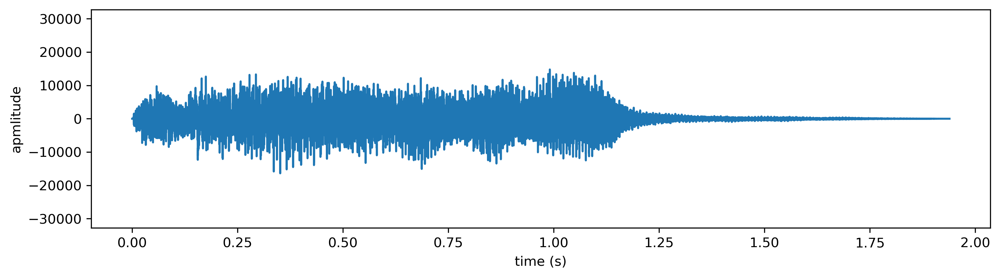

In [4]:
rate, samples = wavfile.read("tada.wav")
wave = SoundWave(rate, samples)
wave.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [5]:
wave.export("wave1.wav", force=True)
wave.export("wave2.wav")

In [6]:
IPython.display.Audio(filename="tada.wav")

In [7]:
IPython.display.Audio(filename="wave1.wav")

In [8]:
IPython.display.Audio(filename="wave2.wav")

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [9]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    rate = 44100 #number of samples per second
    domain = np.linspace(0,duration,int(rate*duration)) #rate*duration equally spaced points
    sound_samples = np.sin(2*np.pi*domain*frequency) #apply transformation to random draws
    #print(min(domain), max(domain), min(sound_samples), max(sound_samples))
    return SoundWave(rate, sound_samples) #SoundWave object

In [10]:
new_note = generate_note(440,2)
new_note.export("new.wav")
IPython.display.Audio(filename="new.wav")

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [11]:
A_note = generate_note(440,3) #intialize notes
C_note = generate_note(523.25,3)
E_note = generate_note(659.25,3)
ACE_note = A_note.__add__(C_note) #superimpose
ACE_note = ACE_note.__add__(E_note) #superimpose again
ACE_note.export("ACE.wav")
IPython.display.Audio(filename="ACE.wav")

In [12]:
A_note = generate_note(440,1) #initalize notes
C_note = generate_note(523.25,1)
E_note = generate_note(659.25,1)
ACE_conc = A_note.__rshift__(C_note) #shift
ACE_conc = ACE_conc.__rshift__(E_note) #shift again
ACE_conc.export("ACE_conc.wav")
IPython.display.Audio(filename="ACE_conc.wav")

### Problem 1.5

- Implement `simple_dft()` with the formula $c=F_nf$, where $F_n$ is the n-dimensional DFT matrix.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [13]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    f = samples
    n = len(samples)
    DFT_mat = (1/n)*np.array([[(np.exp(2*np.pi*(0-1j)*(1/n)))**(q*k) for k in range(0,n)] for q in range(0,n)])
    return DFT_mat @ f

In [14]:
duration = 2
frequency = 440
rate = 10 #number of samples per second
domain = np.linspace(0,duration,int(rate*duration)) #rate*duration equally spaced points
sound_samples = np.sin(2*np.pi*domain*frequency)
samples = sound_samples
n = len(samples)
me = n*simple_dft(samples)
them = fft(samples)
np.allclose(me,them)

True

### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [15]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.

    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.

    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    def _split(g):
        n = len(g) #get the size of the array
        if n <= threshold:
            return n * simple_dft(g) #do a simple dft when small enuff
        else:
            evens = _split(g[::2]) #call the function on the evens
            odds = _split(g[1::2]) #call the function on the odds
            z = np.array([np.exp(-2*np.pi*1j*k/n) for k in range(n)]) #get roots of unity
            m = n // 2 #get mid index
            #part1 = evens + np.multiply(z[:m], odds)
            #part2 = evens + np.multiply(z[m:], odds)
            return np.concatenate((evens + np.multiply(z[:m],odds), evens + np.multiply(z[m:],odds)))
    return _split(samples) / len(samples) #multiple result by (1/n)

In [16]:
samples = np.random.randint(-32768, 32767, 256, dtype=np.int16)
%time n*simple_dft(samples)
%time me = len(samples)*(simple_fft(samples))
%time them = fft(samples)
#print(me,'\n',them)
np.allclose(me,them)

Wall time: 210 ms
Wall time: 9.8 ms
Wall time: 0 ns


True

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

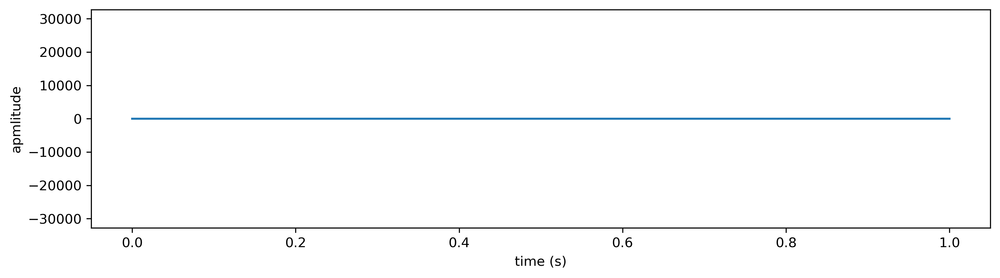

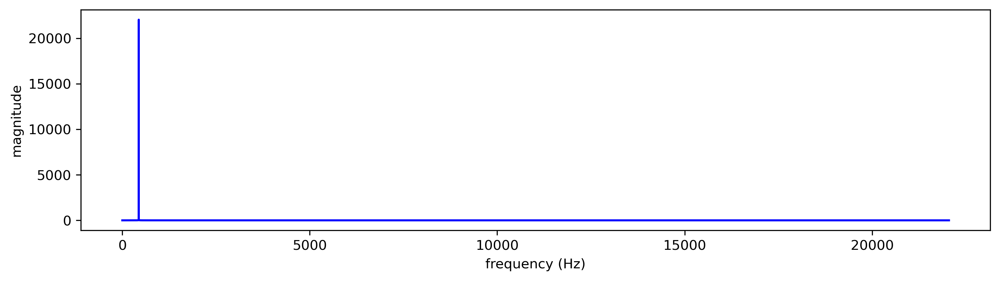

In [17]:
A_note = generate_note(440,1)
A_note.plot(freq_plot=True)

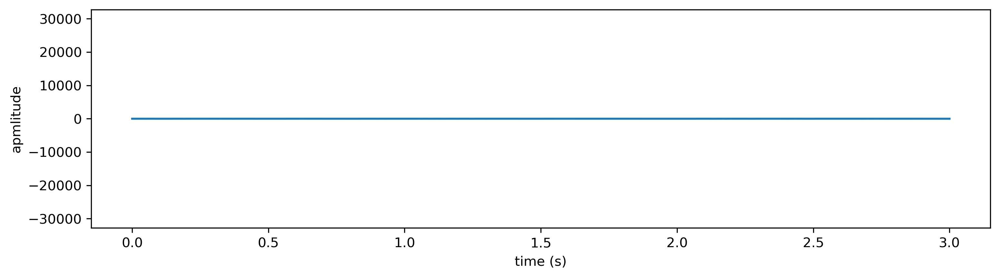

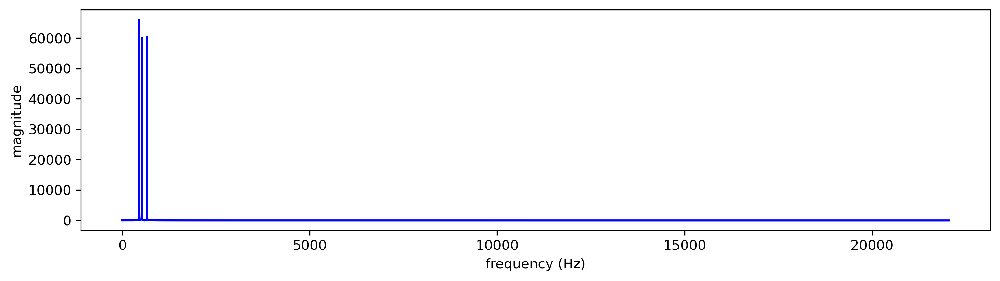

In [18]:
ACE_note.plot(freq_plot=True)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

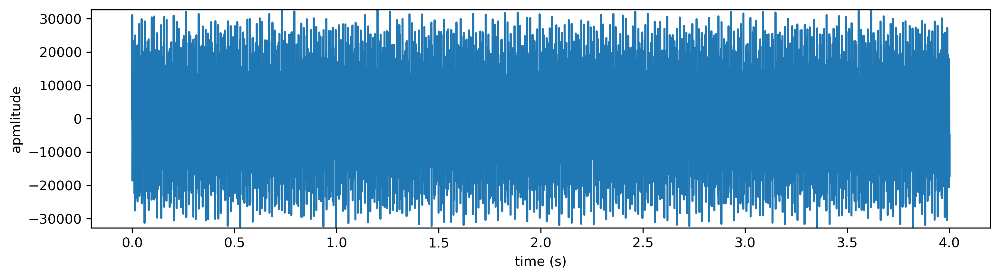

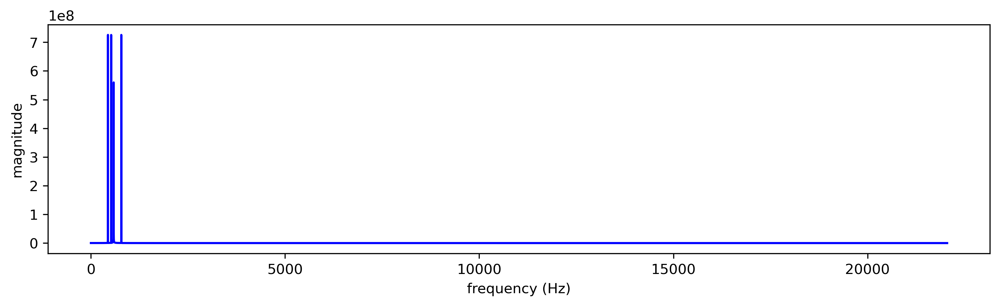

In [19]:
rate, samples = wavfile.read("mystery_chord.wav")
happy_wave = SoundWave(rate, samples)
happy_wave.plot(freq_plot=True) #we see there are 4 frequencies

In [20]:
C_k_lst = fft(samples)
C_k_lst = np.abs(C_k_lst[:len(C_k_lst)//2]) #magnitudes
freq_lst = [((rate * k)/len(samples)) for k in range(len(samples) // 2)] #has frequencies
orders = np.argsort(C_k_lst) 
descending = orders[::-1]
biggest_four = descending[:4] #4 frequencies of the highest amplitude
print((biggest_four * rate) / len(samples))

[440.   784.   523.25 587.5 ]


The notes are A,G,C,D

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [21]:
rate = 22050
white_noise = np.random.randint(-32767, 32767, rate*2, dtype=np.int16)
white_noise = SoundWave(rate, white_noise) #make a whitenoise sound object
tada_rate, samples = wavfile.read("tada.wav")
tada_noise = SoundWave(tada_rate, samples) #make a tada noise sound object
convolved_noise = (white_noise * tada_noise)
convolved_noise.export("tada_1_conv.wav")
IPython.display.Audio(filename="tada_1_conv.wav")

In [22]:
new_noise = (convolved_noise) >> (convolved_noise) #convolve then append to tada noise
new_noise.export("tada_yucky.wav")
IPython.display.Audio(filename="tada_yucky.wav")

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [23]:
rate_c, samples_c = wavfile.read("CGC.wav")
CGC = SoundWave(rate_c, samples_c) #soundwave object
IPython.display.Audio("CGC.wav")

In [24]:
rate_g, samples_g = wavfile.read("GCG.wav")
GCG = SoundWave(rate_g, samples_g)
IPython.display.Audio("GCG.wav")

In [25]:
%time my_convolved = CGC ** GCG #linearly convolve
my_convolved.export("my_conv_GC.wav")
IPython.display.Audio(filename="my_conv_GC.wav")

Wall time: 305 ms


In [26]:
%time scipy_conv = fftconvolve(samples_c,samples_g) #convolve using scipy library
their_conv_GC = SoundWave(CGC.rate, scipy_conv)
their_conv_GC.export("their_conv_GC.wav")
IPython.display.Audio(filename="their_conv_GC.wav")

Wall time: 39.8 ms


### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [27]:
rate_chop, samples_chop = wavfile.read("chopin.wav")
chopin = SoundWave(rate_chop, samples_chop) #make soundwave object
IPython.display.Audio(filename="chopin.wav")

In [28]:
rate_ball, samples_ball = wavfile.read("balloon.wav")
balloon = SoundWave(rate_ball, samples_ball) #make soundwave object
IPython.display.Audio(filename="balloon.wav")

In [29]:
pian_ball_conv = balloon ** chopin #convolved using deez nuts
pian_ball_conv.export("conv_cho_ball.wav")
IPython.display.Audio(filename="conv_cho_ball.wav")

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

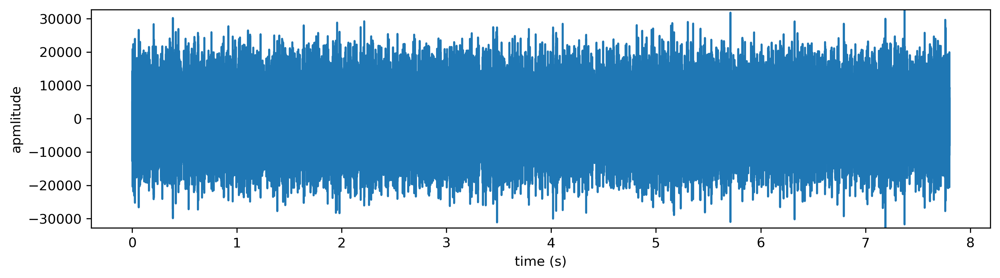

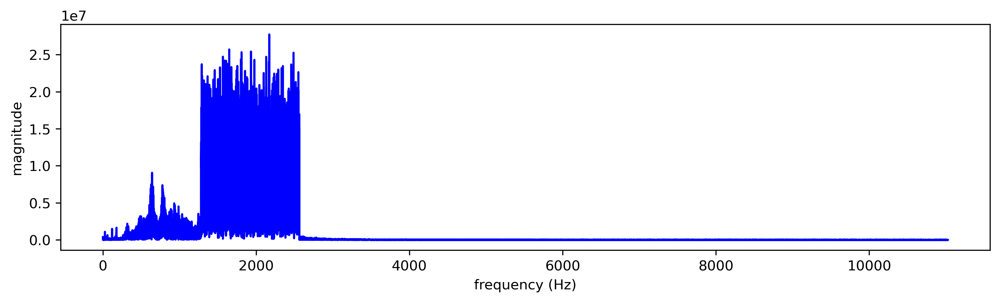

In [30]:
noisy1_rate, noisy1_samples = wavfile.read("noisy1.wav")
noisy1 = SoundWave(noisy1_rate, noisy1_samples)
noisy1.plot(freq_plot=True)
IPython.display.Audio(filename="noisy1.wav")

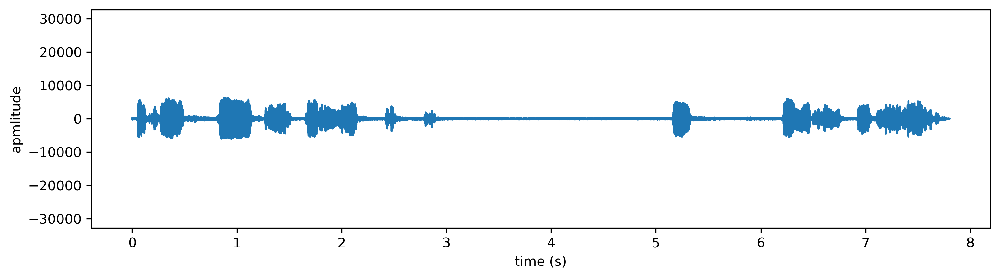

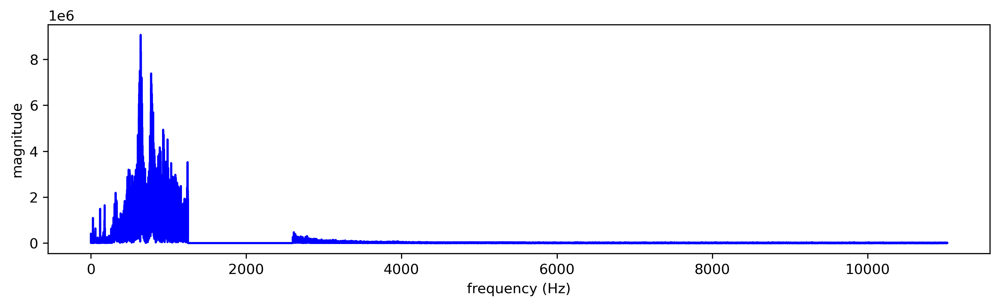

In [31]:
noisy1_clean = noisy1.clean(1250,2600)
noisy1_clean.export("noisy1clean.wav")
noisy1_clean.plot(freq_plot=True)
IPython.display.Audio(filename="noisy1clean.wav")

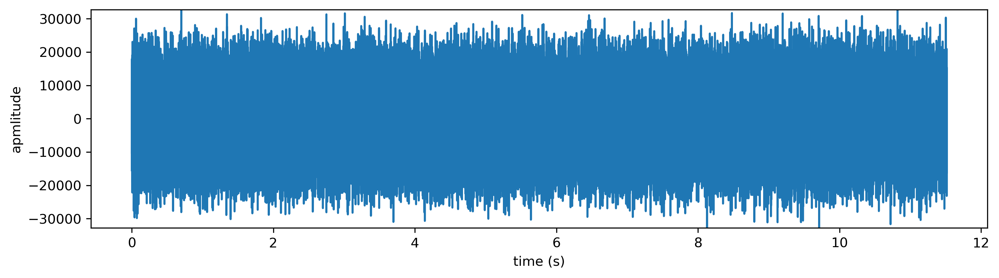

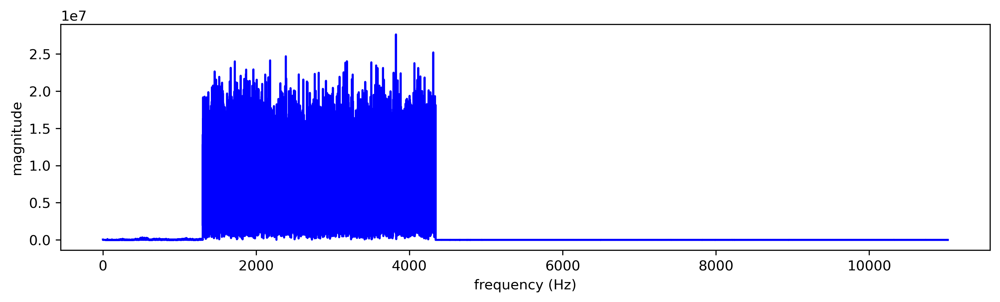

In [32]:
noisy2_rate, noisy2_samples = wavfile.read("noisy2.wav")
noisy2 = SoundWave(noisy2_rate, noisy2_samples)
noisy2.plot(freq_plot=True)
IPython.display.Audio(filename="noisy2.wav")

In [33]:
noisy2_clean = noisy2.clean(1300,4342)
noisy2_clean.export("noisy2clean.wav")
IPython.display.Audio(filename="noisy2clean.wav")

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [34]:
vuvu_rate, vuvu_samples = wavfile.read("vuvuzela.wav")
#vuvu_samp_ch1 = vuvu_samples[:,0]
#vuvu_samp_ch2 = vuvu_samples[:,1]
l_freq, h_freq = 200, 500
#n = vuvu_samples.shape[0]
#k_l = (l_freq * n) // vuvu_rate
#k_hi = (h_freq * n) // vuvu_rate
IPython.display.Audio(filename="vuvuzela.wav")

In [35]:
#vuvu1_transformed = fft(vuvu_samp_ch1)
#vuvu1_transformed[k_l:k_hi] = 0
#vuvu1_transformed[n-k_hi:n-k_l] = 0
#inv_vuvu1 = ifft(vuvu1_transformed)
#vuvu_clean1 = inv_vuvu1.real
vuvuzela1 = SoundWave(vuvu_rate, vuvu_samples[:,0])
vuvuzela1 = vuvuzela1.clean(l_freq,h_freq)

In [36]:
#vuvu2_transformed = fft(vuvu_samp_ch2)
#vuvu2_transformed[k_l:k_hi] = 0
#vuvu2_transformed[n-k_hi:n-k_l] = 0
#inv_vuvu2 = ifft(vuvu2_transformed)
#vuvu_clean2 = inv_vuvu2.real
vuvuzela2 = SoundWave(vuvu_rate, vuvu_samples[:,1])
vuvuzela2 = vuvuzela2.clean(l_freq,h_freq)

In [37]:
vuvu_all_clean = vuvuzela1 + vuvuzela2
vuvu_all_clean.export("vuvuzela_clean.wav")
IPython.display.Audio(filename="vuvuzela_clean.wav")

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

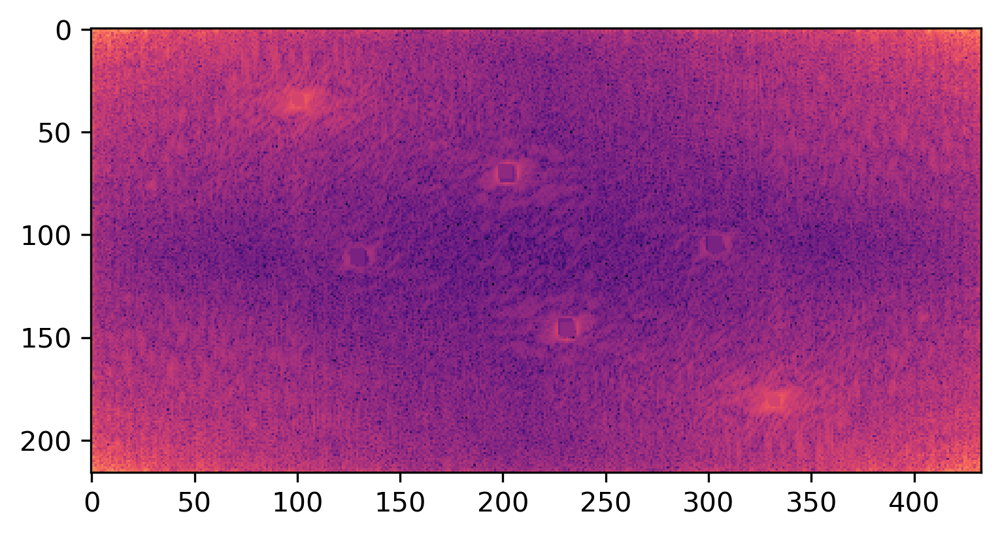

In [38]:
image = imageio.imread("license_plate.png")
im_dft = fft2(image)
dft_mean = np.mean(im_dft)
m,n = image.shape
row_kill = [[33,38],[179,184],[108,115],[67,75],[143,150],[101,109]]
col_kill = [[99,104],[330,335],[127,134],[199,206],[228,235],[300,307]]

for i in range(len(col_kill)):
    rkl,rkhi,ckl,ckhi = row_kill[i][0],row_kill[i][1],col_kill[i][0],col_kill[i][1]
    mean_up, mean_down = np.mean(im_dft[rkl-5:rkhi-5,ckl:ckhi]), np.mean(im_dft[rkl+5:rkhi+5,ckl:ckhi])
    mean_right, mean_left = np.mean(im_dft[rkl:rkhi,ckl+5:ckhi+5]), np.mean(im_dft[rkl:rkhi,ckl-5:ckhi-5])
    mean_surround = (1/4) * (mean_left + mean_right + mean_down + mean_up)
    im_dft[rkl:rkhi,ckl:ckhi] = mean_surround
    im_dft[m-rkhi:m-rkl,n-ckhi:n-ckl] = mean_surround

plt.imshow(np.log(np.abs(im_dft)), cmap="magma")
plt.show()    

#plt.imshow(image, cmap="gray")
#plt.show()

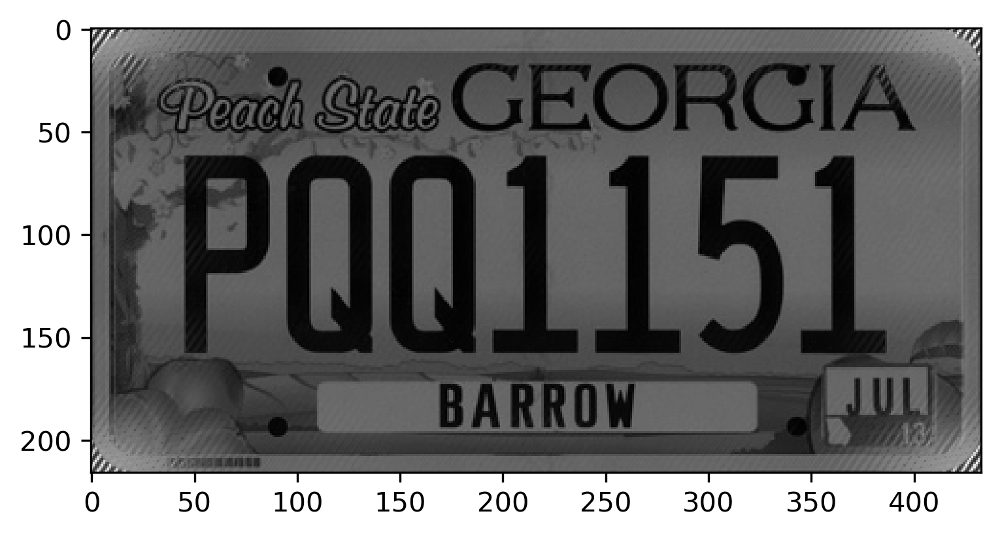

In [39]:
product = ifft2(im_dft).real
plt.imshow(product, cmap="gray")
plt.show()

The year on the sticker is...2013